# Product Segmentation - Experiment & Model Selection

**Context:** Before predicting individual customer behavior, it is crucial to decode the product landscape. In this first part of the assignment, we explore the Vibrent product catalog using state-of-the-art multimodal embeddings (Voyage AI). 

**Goal of this Notebook:** This notebook focuses purely on the Data Science and Engineering aspects. We conduct various experiments to find the most robust and semantically meaningful segmentation strategy. The final chosen model will then be deployed in the second notebook for business analysis.

# Imports

In [ ]:
import pandas as pd
import numpy as np

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import adjusted_rand_score

import hdbscan
import umap

import matplotlib.pyplot as plt
import seaborn as sns

import sys
from pathlib import Path

# Add src/ to path (once, so imports work)
sys.path.append(str(Path().resolve().parent / "src"))

# Enable autoreload for Jupyter notebooks
%load_ext autoreload
%autoreload 2

from paths import DATA_DATASETS, DATA_EMBEDDINGS, DATA_IMAGES
from helper_functions import verify_cluster_labels

Failed to read module file 'C:\Users\JuliusAdmin\AppData\Local\Programs\Python\Python312\Lib\re\_casefix.py' for module 're._casefix': UnicodeDecodeError
Traceback (most recent call last):
  File "c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\IPython\core\extensions.py", line 62, in load_extension
    return self._load_extension(module_str)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\IPython\core\extensions.py", line 77, in _load_extension
    mod = import_module(module_str)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\JuliusAdmin\AppData\Local\Programs\Python\Python312\Lib\importlib\__init__.py", line 90, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 1387, in _gcd_import
  File "<frozen importlib._bootstrap>", l

# Load Data

In [2]:
outfits = pd.read_csv(DATA_DATASETS / "outfits.csv", sep=";")
embeddings = pd.read_csv(DATA_EMBEDDINGS / "embeddings_voyage_multimodal.csv", sep=";")
transactions = pd.read_csv(DATA_DATASETS / "transactions.csv", sep=";")

Join dataframes

In [3]:
data = outfits.merge(embeddings, left_on="id", right_on="outfit_id")

Get embedding-matrix from dataframe

In [4]:
embedding_cols = [col for col in data.columns if col.startswith("dim_")]
X = data[embedding_cols].values

In [5]:
print(np.min(X))
print(np.max(X))

-0.109375
0.125


Scaling/normalizing vectors did not improve performance --> vectors are already normalized 

Compute a 2D UMAP embedding of the high-dimensional feature matrix X for visualization.
The embedding is calculated once and reused to avoid repeated expensive computations.

In [6]:
reducer_2d = umap.UMAP(
    n_components=2,
    n_neighbors=50,
    min_dist=0.1,
    metric="cosine",
    random_state=42
)

X_2d = reducer_2d.fit_transform(X)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


# Case 1: 2048 dimensions

The following two subsections are commented out, because it takes quite a long time to run those (2048 dimensions) and they perform quite poorly compared to the tested methodological approaches.

## DBSCAN

In [7]:
# clusterer = hdbscan.HDBSCAN(min_cluster_size=30, metric='euclidean')
# labels = clusterer.fit_predict(X)

In [8]:
# np.unique(labels)

In [9]:
# noise_ratio = np.mean(labels == -1)
# print("Noise ratio:", noise_ratio)

In [10]:
# pd.Series(labels).value_counts()

Super dominant cluster (ca. 84%) and 4 relatively small clusters. Noise is fine.

In [11]:
# clusterer_200 = hdbscan.HDBSCAN(min_cluster_size=200, metric='euclidean')
# labels_200 = clusterer_200.fit_predict(X)

In [12]:
# np.unique(labels_200)

# noise_ratio = np.mean(labels_200 == -1)
# print("Noise ratio:", noise_ratio)

# pd.Series(labels_200).value_counts()

**Results/Interpretation:** 

HDBSCAN clustering results in 1 big cluster with multiple small clusters and in another trial in mainly noise. This hints at products being semantically relatively similar with just a few strongly divergent styles, which is not uncommon in fashion catalogs. Since HDBSCAN works with density based clustering this could be the reason why it does not work effectively on the fashion embeddings.

## K-Means

Elbow method to get optimal amount of clusters:

In [13]:
# inertia = []
# K_range = range(2, 20)

# for k in K_range:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(X)
#     inertia.append(kmeans.inertia_)

# plt.plot(K_range, inertia)
# plt.xlabel("Number of Clusters")
# plt.ylabel("Inertia")
# plt.title("Elbow Method")
# plt.show()

In [14]:
# scores = []

# for k in K_range:
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     labels = kmeans.fit_predict(X)
#     score = silhouette_score(X, labels)
#     scores.append(score)

# plt.plot(K_range, scores)
# plt.xlabel("Number of Clusters")
# plt.ylabel("Silhouette Score")
# plt.show()

In [15]:
# print("Best K (Elbow):", K_range[np.argmin(inertia)])
# print("Best K (Silhouette):", K_range[np.argmax(scores)])

Use 6 clusters for KMeans 

In [16]:
# kmeans = KMeans(n_clusters=6, random_state=42)
# data["cluster"] = kmeans.fit_predict(X)

In [17]:
# cluster_summary = data.groupby("cluster")["retailPrice"].mean().sort_values()
# print(cluster_summary)

In [18]:
# data["cluster"].value_counts()

In [19]:
# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(X)

# plt.figure(figsize=(8,6))
# sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=data["cluster"], palette="tab10")
# plt.title("Product Clusters (PCA Projection)")
# plt.show()

In [20]:
# merged = transactions.merge(data[["id", "cluster"]], 
#                             left_on="outfit.id", 
#                             right_on="id")

# cluster_revenue = merged.groupby("cluster").size().sort_values(ascending = False)
# print(cluster_revenue)

# Case 2: Dimension reduction with UMAP

Dimension reduction with UMAP to 20 dimensions to confirm that 2048 dimensions is too much to form robust clusters (Curse of dimensionality) with the K-Means algorithm. 

Initilize reducer 

In [21]:
reducer = umap.UMAP(
    n_components = 20, # reduce to 20 dimensions for clustering
    n_neighbors = 50,
    min_dist = 0.1,
    metric = "cosine",
    random_state = 42 # for reproducibility
)

X_reduced = reducer.fit_transform(X)

c:\Users\JuliusAdmin\Documents\GitHub\Marketing-Analytics\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## UMAP + KMEANS

In [ ]:
results = []

for k in range(2, 20):
    kmeans = KMeans(n_clusters = k, random_state = 42)
    labels = kmeans.fit_predict(X_reduced)

    sil_score = silhouette_score(X_reduced, labels)

    cluster_sizes = pd.Series(labels).value_counts().sort_index()
    imbalance = cluster_sizes.std() / cluster_sizes.mean() # relative imbalance - higher is more imbalanced
    results.append({
        "k": k,
        "silhouette": sil_score,
        "min_cluster_size": cluster_sizes.min(),
        "max_cluster_size": cluster_sizes.max(),
        "imbalance": imbalance
    })

results_df = pd.DataFrame(results)
print(results_df)

     k  silhouette  min_cluster_size  max_cluster_size  imbalance
0    2    0.547607              6630              9019   0.215896
1    3    0.573244               421              8598   0.818173
2    4    0.523904               421              6630   0.687849
3    5    0.553352               323              6630   0.886355
4    6    0.600752               323              6630   0.943307
5    7    0.608660                59              6630   1.090329
6    8    0.644516               323              6623   1.021762
7    9    0.452690               323              3622   0.631229
8   10    0.463004                59              3615   0.740607
9   11    0.465627                59              2564   0.602465
10  12    0.467662                59              2564   0.679283
11  13    0.481700                59              2437   0.712222
12  14    0.484444                15              2437   0.788691
13  15    0.484788                15              2437   0.859708
14  16    

A comprehensive cluster scan revealed a clear global silhouette maximum at K = 8. Beyond K = 8, cluster cohesion dropped substantially and micro-clusters emerged, indicating over-segmentation. At k = 8 the smallest cluster size is still at 323. A size that can still be interpreted and used for further analysis. A size of 59 makes generalizability harder.

Therefore, K = 8 was selected as the optimal balance between semantic seperation and managerial interpretability. 

Check cluster stability

In [66]:
for k in range(5, 15):
    aris = []
    for seed in range(100):
        k1 = KMeans(n_clusters=k, random_state=seed).fit(X_reduced)
        k2 = KMeans(n_clusters=k, random_state=seed+100).fit(X_reduced)

        aris.append(adjusted_rand_score(k1.labels_, k2.labels_))

    print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=5: 0.8303206865127523
Mean ARI for k=6: 0.8429372563388118
Mean ARI for k=7: 0.82670500071154
Mean ARI for k=8: 0.8496461643282803
Mean ARI for k=9: 0.8326283723169056
Mean ARI for k=10: 0.8511884563415141
Mean ARI for k=11: 0.8269938904292318
Mean ARI for k=12: 0.8385046389112597
Mean ARI for k=13: 0.8314305287529017
Mean ARI for k=14: 0.8267056870962888


Cluster robustness was evaluated across multiple random initializations for mutiple different cluster numbers. The mean Adjusted Rand Index (ARI) of 0.85 indicates strong structural stability for k = 8. Therefore, the 8-cluster solution is both well-separated and reproducible.

In [24]:
k = 8

kmeans = KMeans(n_clusters=k, random_state=42)

data_umap_kmeans = data.copy()

data_umap_kmeans["cluster"] = kmeans.fit_predict(X_reduced)

In [25]:
data_umap_kmeans["cluster"].value_counts()

cluster
2    6623
1    2168
7    1911
3    1704
5    1409
6    1090
0     421
4     323
Name: count, dtype: int64

In [26]:
cluster_names = {   0: "Iconic Arm Candy", 
                    1: "Blouses & Shirts", 
                    2: "Dress", 
                    3: "Nordic Comfort", 
                    4: "Golden Hour Details", 
                    5: "Trousers", 
                    6: "Skirts", 
                    7: "Jackets & Coats" }

data_umap_kmeans["cluster_name"] = data_umap_kmeans["cluster"].map(cluster_names)

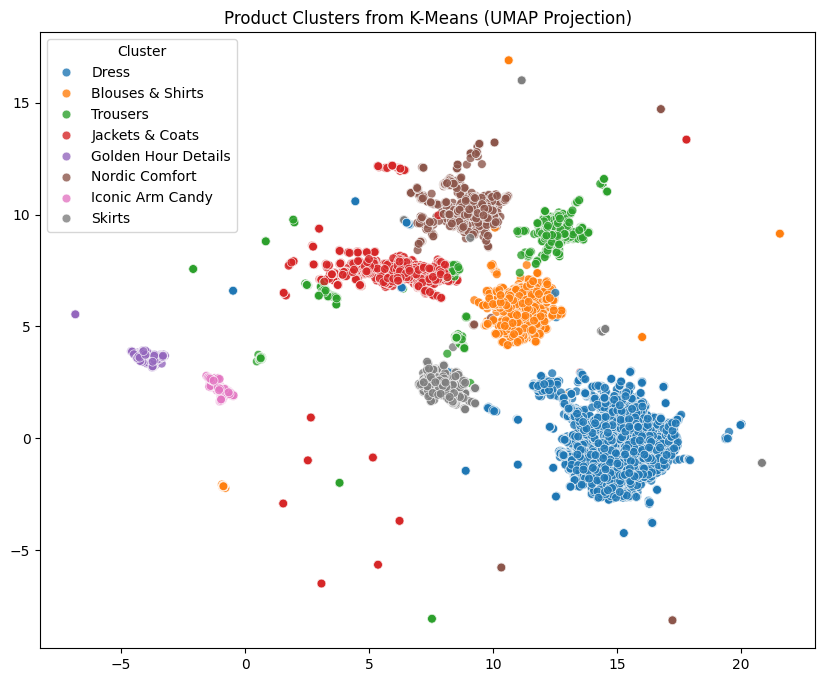

In [27]:
plt.figure(figsize=(10,8))
sns.scatterplot(
    x=X_2d[:,0],
    y=X_2d[:,1],
    hue=data_umap_kmeans["cluster_name"],
    palette="tab10",
    s=40,
    alpha=0.8
)

plt.title("Product Clusters from K-Means (UMAP Projection)")
plt.legend(title="Cluster")
plt.show()

## UMAP + HDBSCAN

Use same dimension reduction from earlier to test if get the same segments.

In [28]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=200, metric='euclidean')
labels = clusterer.fit_predict(X_reduced)

data_umap_hdbscan = data.copy()
data_umap_hdbscan["cluster"] = labels

In [29]:
print(np.unique(labels))

noise_ratio = np.mean(labels == -1)
print("Noise ratio:", noise_ratio)

pd.Series(labels).value_counts()

[-1  0  1  2  3  4  5  6  7]
Noise ratio: 0.06990862035912838


 7    5854
 3    3111
 4    2041
 5    1519
-1    1094
 2    1080
 1     421
 0     314
 6     215
Name: count, dtype: int64

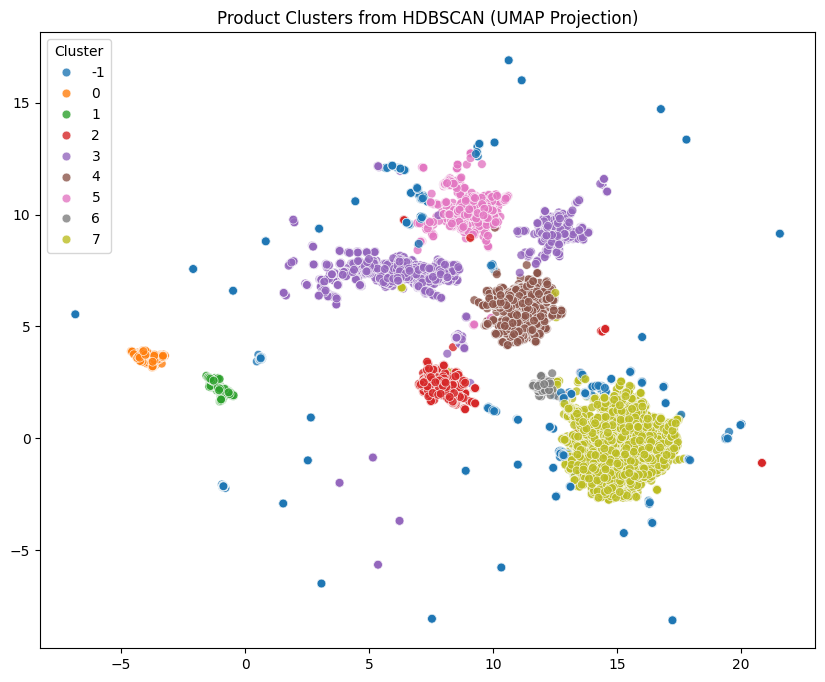

In [30]:
plt.figure(figsize=(10,8))
sns.scatterplot(
    x=X_2d[:,0],
    y=X_2d[:,1],
    hue=data_umap_hdbscan["cluster"],
    palette="tab10",
    s=40,
    alpha=0.8
)

plt.title("Product Clusters from HDBSCAN (UMAP Projection)")
plt.legend(title="Cluster")
plt.show()

**Results**

Fairly similar segmentation. Continuing with KMeans clusters, because HDBSCAN classifies some products as noise so it is harder to interpret those. 

HDBSCAN fails to correctly differentiate between trousers and jackets/coats, but is able to segment jumpsuits (cluster 6) from dresses (cluster 7).

# Case 3: Dimension cutting using only the most important embedding vectors (Matryoshka Embeddings)

**Data Slicing**

The Voyage Multimodal allows us to just take the first 256 dimensions of the embeddings. The modal was build in a way that the first 256 dimensions have the most important information stored with finer more detailed info in the other dimensions. Taking the first dimensions could improve the ability of kmeans and HDBSCAN to better find clusters.

In [ ]:
# Reducing dimensionality by selecting the first 256 features
X_256 = X[:, :256]
print(f"Data sliced to: {X_256.shape} instead of {X.shape}")

## HDBSCAN

Results are poor as expected. The method is not able to build stable clusters.

In [71]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=50, metric='euclidean')
labels = clusterer.fit_predict(X_256)

data_umap_hdbscan = data.copy()
data_umap_hdbscan["cluster"] = labels

In [72]:
print(np.unique(labels))

noise_ratio = np.mean(labels == -1)
print("Noise ratio:", noise_ratio)

pd.Series(labels).value_counts()

[-1  0  1]
Noise ratio: 0.03751038405009905


 0    14887
-1      587
 1      175
Name: count, dtype: int64

UMAP Projection in 2D space

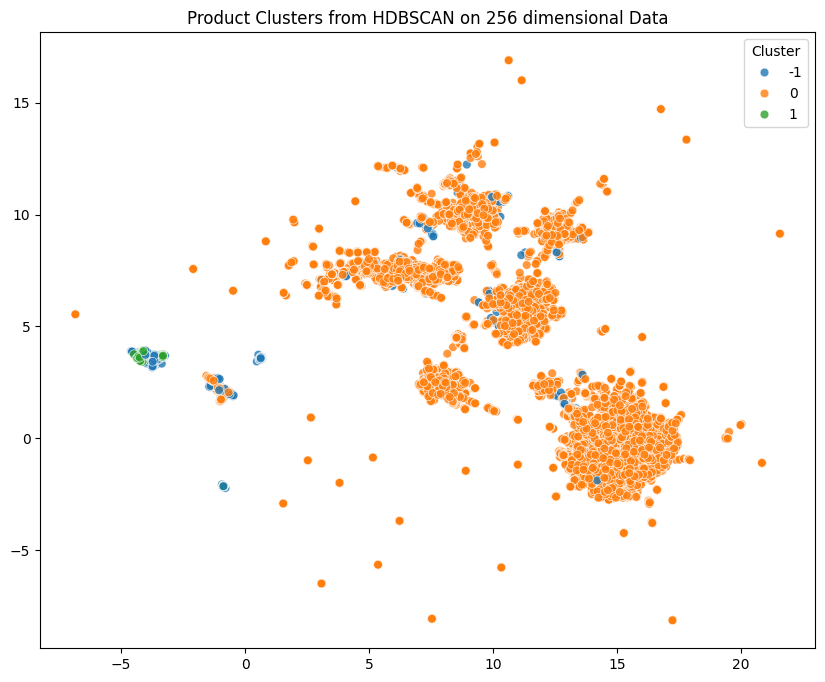

In [73]:
plt.figure(figsize=(10,8))
sns.scatterplot(
    x=X_2d[:,0],
    y=X_2d[:,1],
    hue=data_umap_hdbscan["cluster"],
    palette="tab10",
    s=40,
    alpha=0.8
)

plt.title("Product Clusters from HDBSCAN on 256 dimensional Data")
plt.legend(title="Cluster")
plt.show()

## KMeans

**Step 1: Optimal Cluster Scan**

In [32]:
results = []

for k in range(2, 20):
    kmeans = KMeans(n_clusters = k, random_state = 42)
    labels = kmeans.fit_predict(X_256)

    sil_score = silhouette_score(X_256, labels)

    cluster_sizes = pd.Series(labels).value_counts().sort_index()
    imbalance = cluster_sizes.std() / cluster_sizes.mean() # relatice imbalance - higher is more imbalanced
    results.append({
        "k": k,
        "silhouette": sil_score,
        "min_cluster_size": cluster_sizes.min(),
        "max_cluster_size": cluster_sizes.max(),
        "imbalance": imbalance
    })

results_df = pd.DataFrame(results)
print(results_df)

     k  silhouette  min_cluster_size  max_cluster_size  imbalance
0    2    0.073424              6734              8915   0.197099
1    3    0.077623               925              7988   0.722492
2    4    0.082460               908              6737   0.610401
3    5    0.087737               909              6364   0.658082
4    6    0.088145               895              6326   0.729406
5    7    0.094272               897              6279   0.821569
6    8    0.069793               897              3702   0.457699
7    9    0.067958               897              2315   0.278044
8   10    0.067027               897              2089   0.240698
9   11    0.062375               726              1993   0.272309
10  12    0.062579               714              1768   0.269578
11  13    0.060311               715              1634   0.242093
12  14    0.059256               706              1633   0.239779
13  15    0.057022               244              1630   0.327788
14  16    

**Step 3: Check Cluster Stability**

In [33]:
for k in range(5, 15):
    aris = []
    for seed in range(25):
        k1 = KMeans(n_clusters=k, random_state=seed).fit(X_256)
        k2 = KMeans(n_clusters=k, random_state=seed+100).fit(X_256)

    aris.append(adjusted_rand_score(k1.labels_, k2.labels_))
    print(f"Mean ARI for k={k}:", np.mean(aris))

Mean ARI for k=5: 0.7191078769822488
Mean ARI for k=6: 0.983524360276354
Mean ARI for k=7: 0.6304223621008284
Mean ARI for k=8: 0.6661011418242769
Mean ARI for k=9: 0.6478230354287513
Mean ARI for k=10: 0.7018750397703742
Mean ARI for k=11: 0.7368756814311388
Mean ARI for k=12: 0.7879339093234319
Mean ARI for k=13: 0.8907022079523744
Mean ARI for k=14: 0.8535837694663547


The optimal number of clusters was determined by jointly evaluating silhouette scores and clustering stability.

The silhouette score (0.94) peaked at k = 7, indicating the best separation between clusters.

Although k = 6 showed higher stability (ARI = 0.98), the separation between clusters was weaker a bit weaker (silhoutte = 0.88). Therefore, k = 7 was selected as the optimal balance between cluster quality and stability.

**Step 4: Final Model Fitting**

The final K-Means model was applied to the sliced dataset. This step assigns each item in the Vibrent catalog to one of the 7 strategic style groups for further analysis.

In [34]:
k = 7

kmeans = KMeans(n_clusters=k, random_state=42)

data_slicing_kmeans = data.copy()
data_slicing_kmeans["cluster"] = kmeans.fit_predict(X_256)

# Displaying the final distribution of items
print(f"Cluster distribution for K={k}:")
print(data_slicing_kmeans["cluster"].value_counts().sort_index())

Cluster distribution for K=7:
cluster
0     897
1    1148
2    2127
3    1489
4    2023
5    1686
6    6279
Name: count, dtype: int64


**Step 5: Cluster Profiling & Identity**

By analyzing the top brands and categories within each group, we identified the specific fashion identity of each cluster, ensuring the segmentation aligns with real-world inventory.

In [35]:
# We focus on the most descriptive columns: 'name' and 'Brand'
profiling_cols = ['name', 'Brand']

for i in range(7):
    print(f"\n" + "="*40)
    print(f"         ANALYSIS OF CLUSTER {i}")
    print("="*40)
    
    for col in profiling_cols:
        if col in data_slicing_kmeans.columns:
            print(f"\nTop 5 {col.upper()}:")
            print(data_slicing_kmeans[data_slicing_kmeans["cluster"] == i][col].value_counts().head(5))


         ANALYSIS OF CLUSTER 0

Top 5 NAME:
name
Golden Pink Elements Picasso Earings    8
Ark Earrings Tortoise                   8
Penny Boot Peach                        6
Malou Red                               6
Lili Gold/Silver                        6
Name: count, dtype: int64

Top 5 BRAND:
Brand
Hasla            91
SILFEN Studio    58
Chanel           50
Kaibosh          46
A/BARENESS       44
Name: count, dtype: int64

         ANALYSIS OF CLUSTER 1

Top 5 NAME:
name
Shiny Black Andorra Skirt        16
Mildred Gold Skirt               13
Yellow Basalt Skirt              12
Shiny Andorra Skirt              12
Shiny Black Grape Leaf Skirt     12
Name: count, dtype: int64

Top 5 BRAND:
Brand
FWSS               118
Mette Møller        88
Holzweiler          74
Samsøe & Samsøe     60
Urban Pioneers      38
Name: count, dtype: int64

         ANALYSIS OF CLUSTER 2

Top 5 NAME:
name
Floral Ring My Bell Top              19
Flerken Wrap Top Blue                12
Simone Jet Black Top 

**Step 6: Final Cluster Naming & Strategic Mapping**

The numerical clusters were mapped to descriptive marketing names.

In [36]:
cluster_names = {
    0: "Accessories & Jewelry",   # Earring and jewelry brands like Hasla
    1: "Modern Skirts",           # High frequency of 'Skirt' items
    2: "Blouses & Tops",          # High frequency of 'Top' and 'Shirt'
    3: "Trousers & Jumpsuits",    # Mixed bottom-heavy/full-body items
    4: "Alpine & Outerwear",      # Winter jackets and parkas (Kari Traa)
    5: "Knitwear & Scarves",      # Sweaters and scarves
    6: "Boutique Dresses"         # High-end dresses (byTiMo, Reformation)
}

data_slicing_kmeans["cluster_name"] = data_slicing_kmeans["cluster"].map(cluster_names)

# Final validation
print("Final Strategic Segmentation for Vibrent:")
print(data_slicing_kmeans["cluster_name"].value_counts())

Final Strategic Segmentation for Vibrent:
cluster_name
Boutique Dresses         6279
Blouses & Tops           2127
Alpine & Outerwear       2023
Knitwear & Scarves       1686
Trousers & Jumpsuits     1489
Modern Skirts            1148
Accessories & Jewelry     897
Name: count, dtype: int64


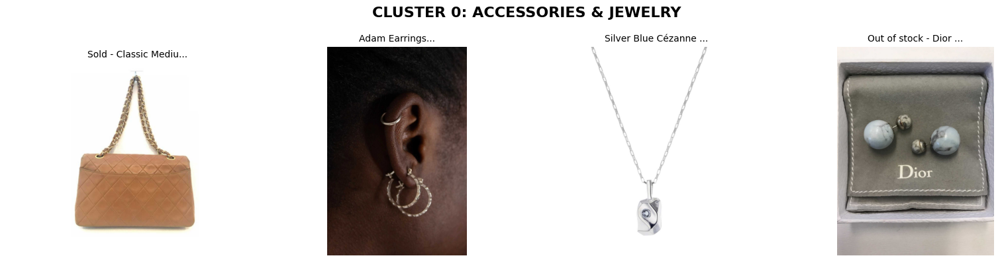

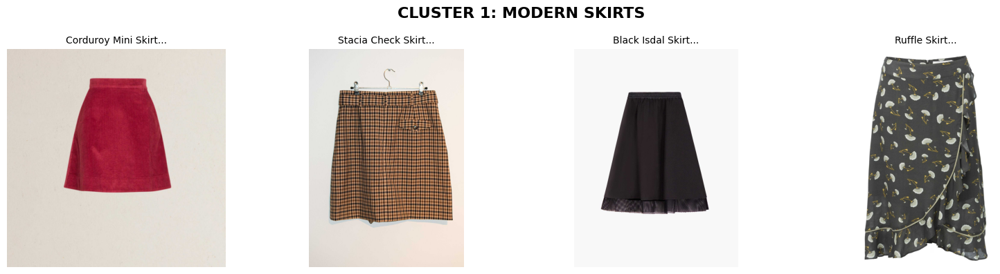

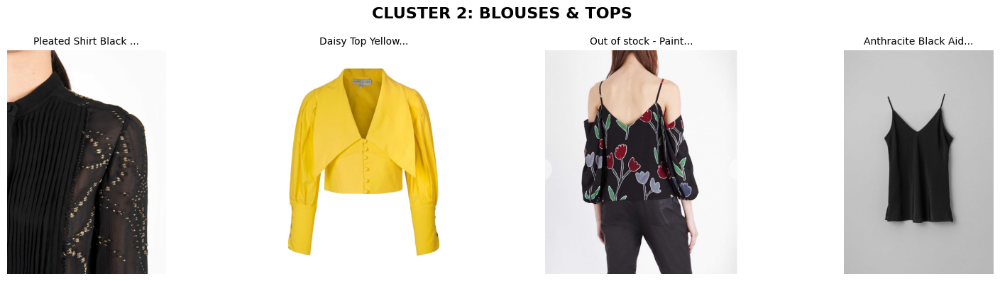

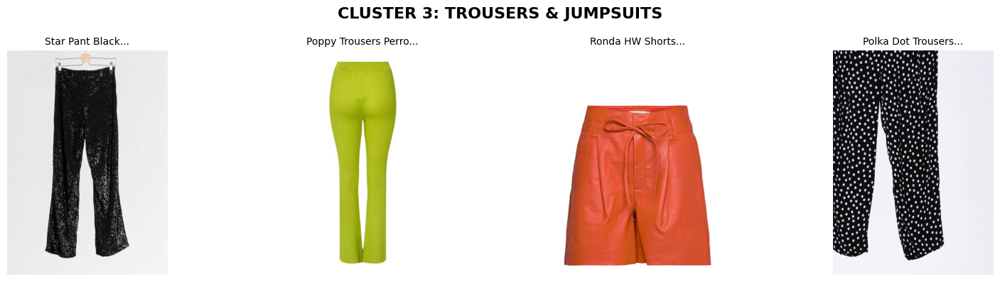

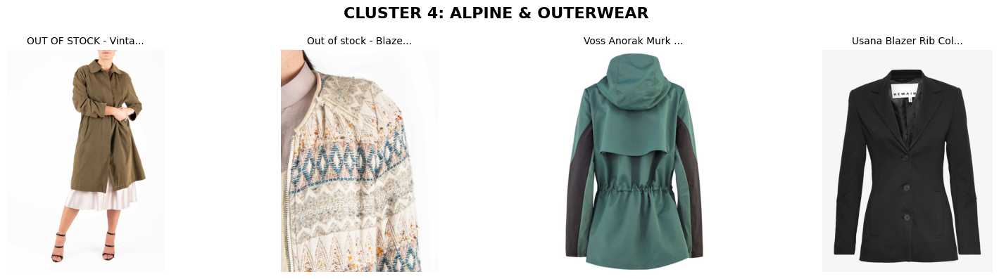

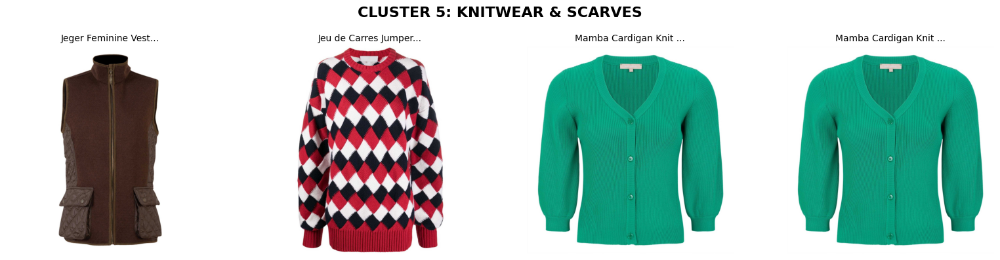

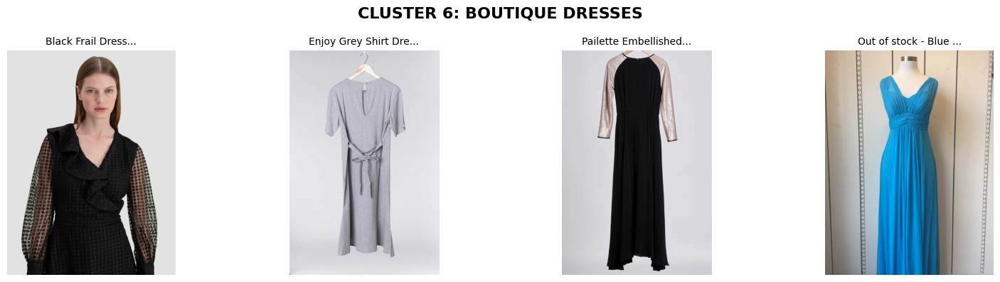

In [37]:
verify_cluster_labels(data_slicing_kmeans, DATA_IMAGES, cluster_names,)

**Step 7: Marketing Visualization with UMAP**

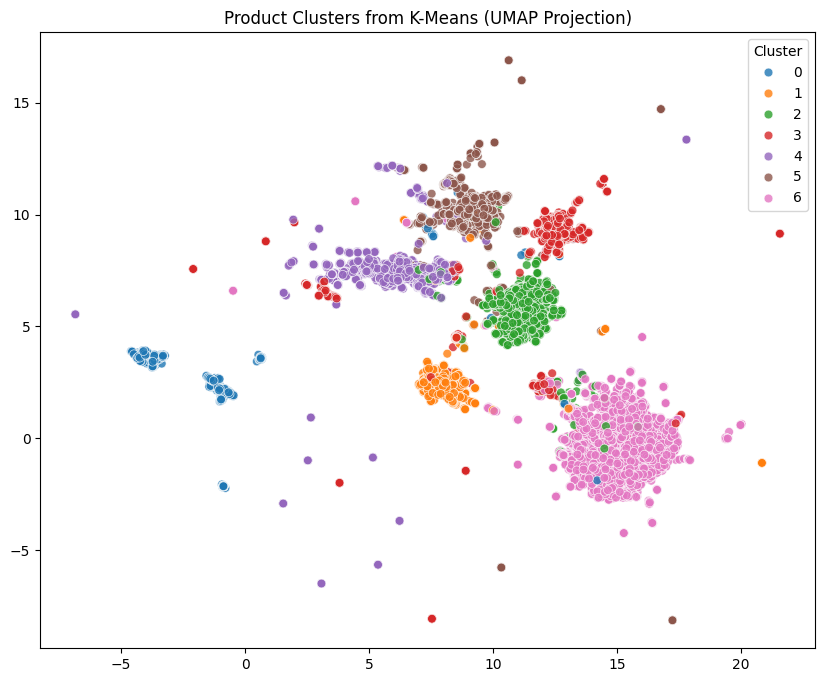

In [ ]:
plt.figure(figsize=(10,8))
sns.scatterplot(
    x=X_2d[:,0],
    y=X_2d[:,1],
    #hue=data_slicing_kmeans["cluster_name"],
    hue=data_slicing_kmeans["cluster"],
    palette="tab10",
    s=40,
    alpha=0.8
)

plt.title("Product Clusters from K-Means on 256 dimensional Data")
plt.legend(title="Cluster")
plt.show()

# Interpretation of Results

## KMeans

Renaming cluster with actual product category

In [39]:
cluster_names_umap_kmeans = {

    0: "Iconic Arm Candy",
    1: "Blouses & Shirts",
    2: "Dress",
    3: "Nordic Comfort",
    4: "Golden Hour Details",
    5: "Trousers",
    6: "Skirts",
    7: "Jackets & Coats"
}

In [40]:
data_umap_kmeans["cluster_label"] = data_umap_kmeans["cluster"].map(cluster_names)

data_umap_kmeans[["id", "cluster", "cluster_label"]].head()

,id,cluster,cluster_label
0,outfit.fffdaa715c3646f8b1c0f04d549ff07e,2,Blouses & Tops
1,outfit.fffa1b9a3db6415d806f3c48f8ab58d9,1,Modern Skirts
2,outfit.fff175b13ceb453f9928625491412ede,2,Blouses & Tops
3,outfit.ffef9d7c292a48b69076d2df2e32352f,1,Modern Skirts
4,outfit.ffeef842238f4dbdabc6c730a75aa2bd,5,Knitwear & Scarves


Get 4 pictures of each cluster to check if KMeans segmentation is good.

In [41]:
missing_count = data_umap_kmeans["picture_0"].isna().sum()

print(f"Number of rows without image: {missing_count}")
print(f"Total number of rows: {len(data_umap_kmeans)}")

Number of rows without image: 492
Total number of rows: 15649


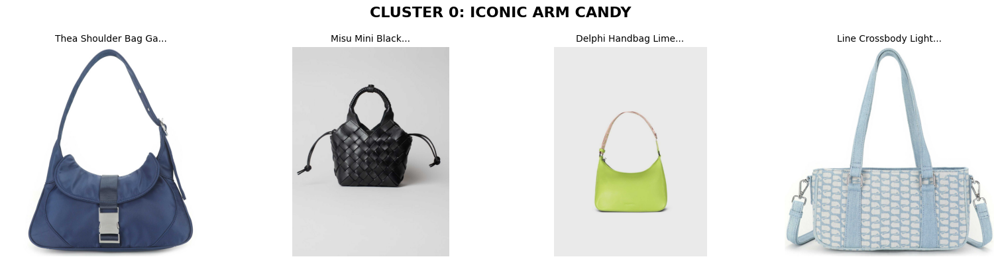

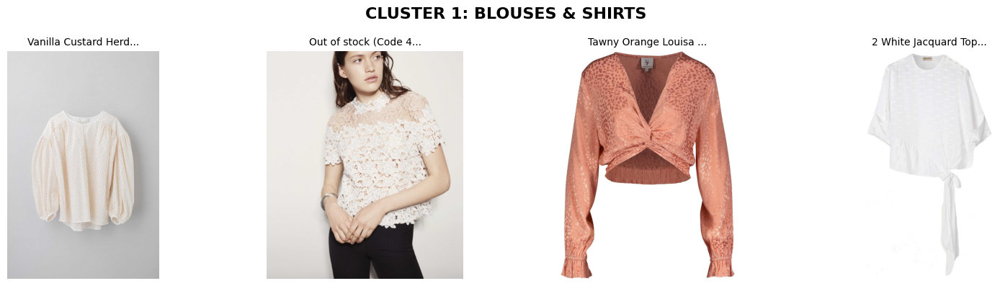

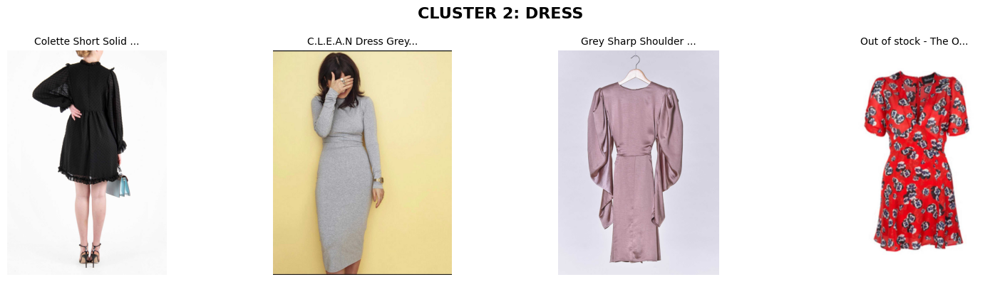

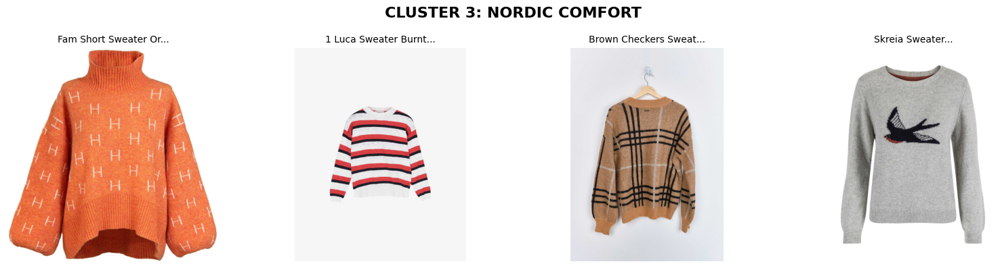

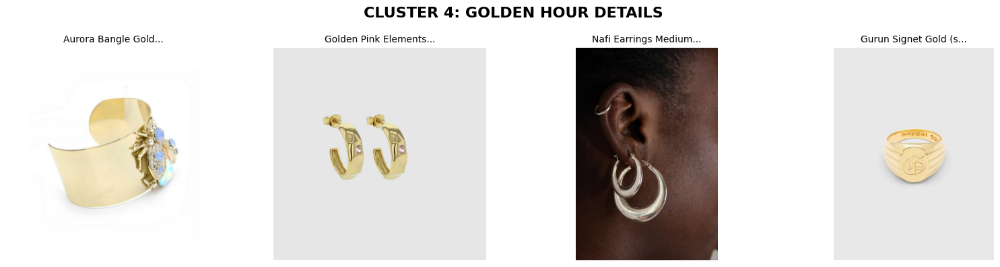

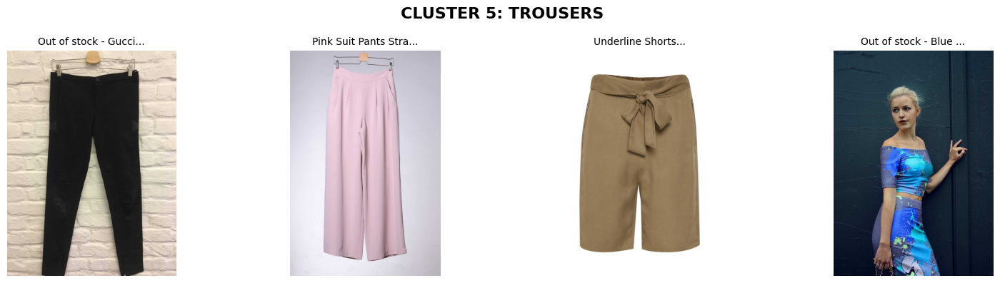

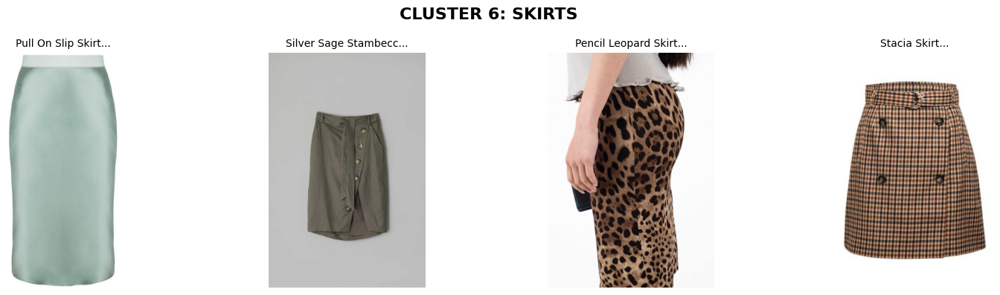

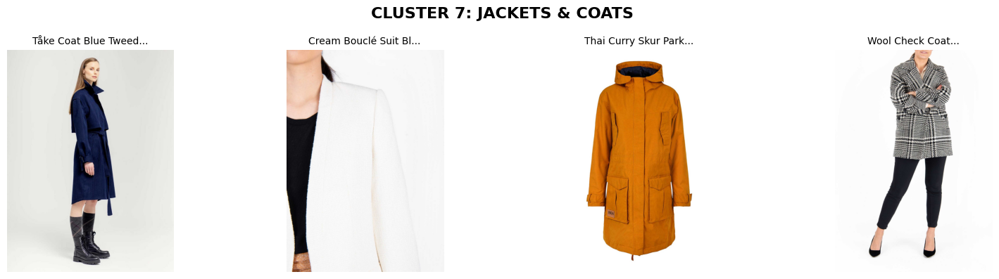

In [42]:
verify_cluster_labels(data_umap_kmeans, DATA_IMAGES, cluster_mapping=cluster_names_umap_kmeans, n_samples=4)

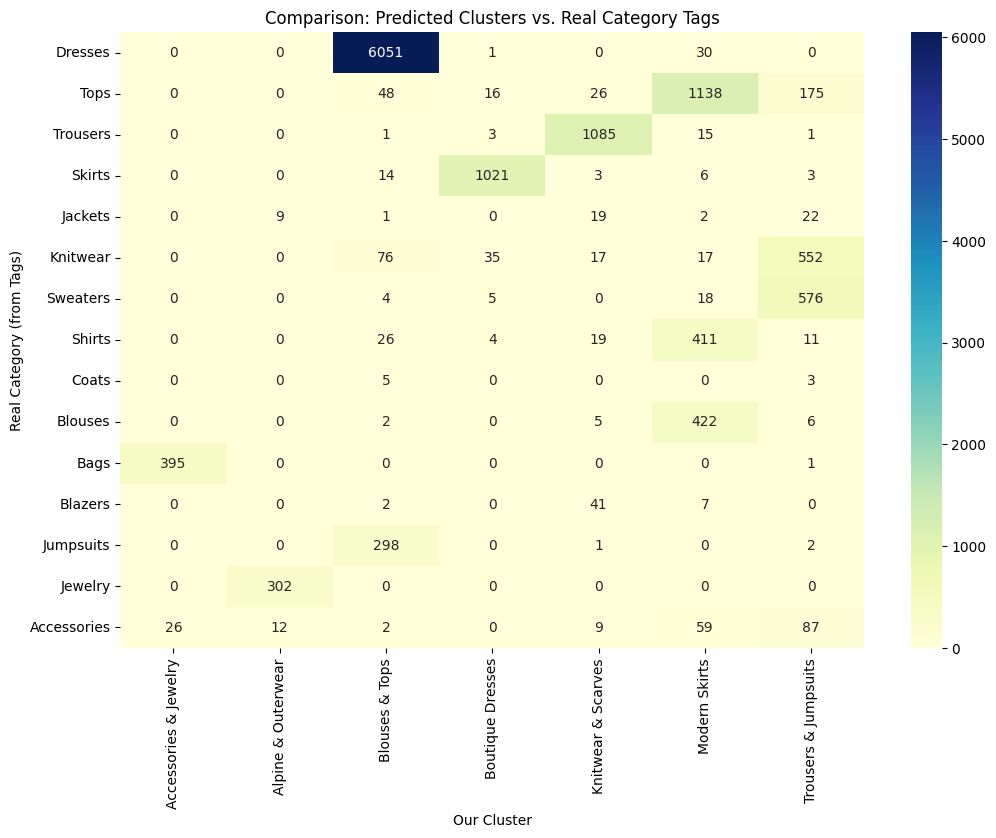

In [44]:
# Extract main category (everything before the first comma)
data_umap_kmeans["main_category"] = data_umap_kmeans["Category"].astype(str).str.split(",").str[0].str.strip()

y_axis = "main_category"
x_axis = "cluster_label"

contingency_table = pd.crosstab(data_umap_kmeans[y_axis], data_umap_kmeans[x_axis])

# Use top 15 categories for better visualization - otherwise too many categories make the heatmap unreadable
top_categories = data_umap_kmeans["main_category"].value_counts().head(15).index
contingency_table = contingency_table.loc[top_categories]

# Visualising with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap="YlGnBu")
plt.title("Comparison: Predicted Clusters vs. Real Category Tags")
plt.ylabel("Real Category (from Tags)")
plt.xlabel("Our Cluster")
plt.yticks(rotation=0)
plt.show()

## HDBSCAN

Get 4 pictures of each cluster to check if HDBSCAN segmentation is good.

In [45]:
missing_count = data_umap_hdbscan["picture_0"].isna().sum()

print(f"Number of rows without image: {missing_count}")
print(f"Total number of rows: {len(data_umap_hdbscan)}")

Number of rows without image: 492
Total number of rows: 15649


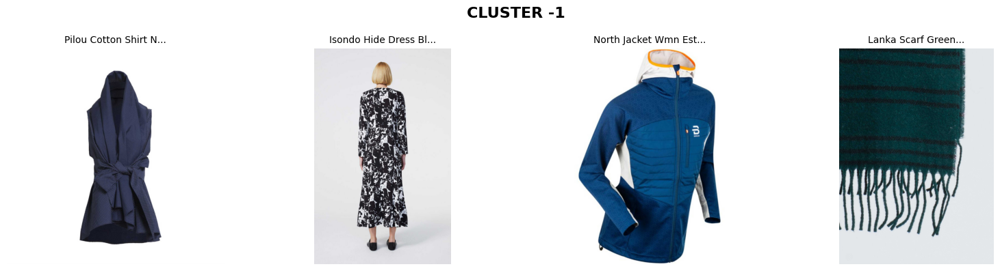

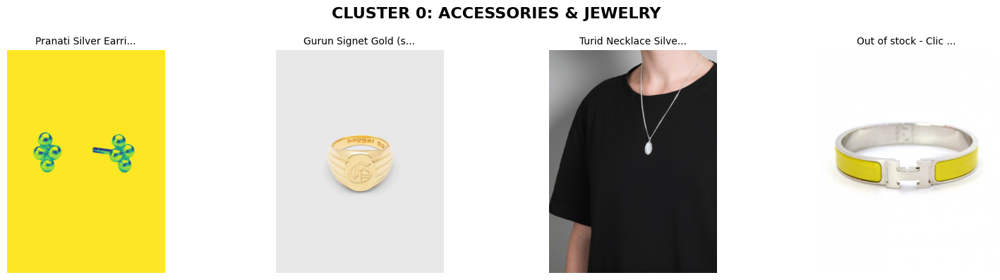

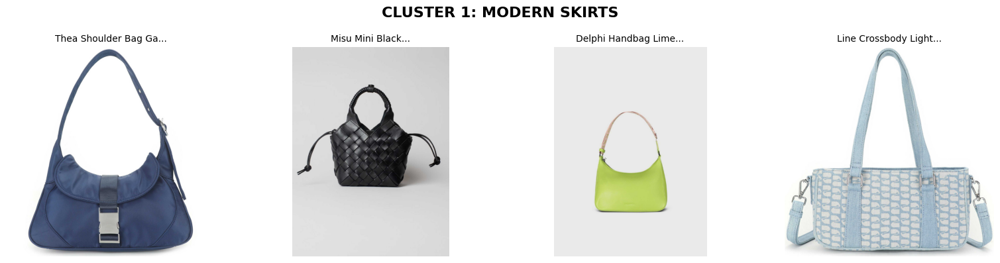

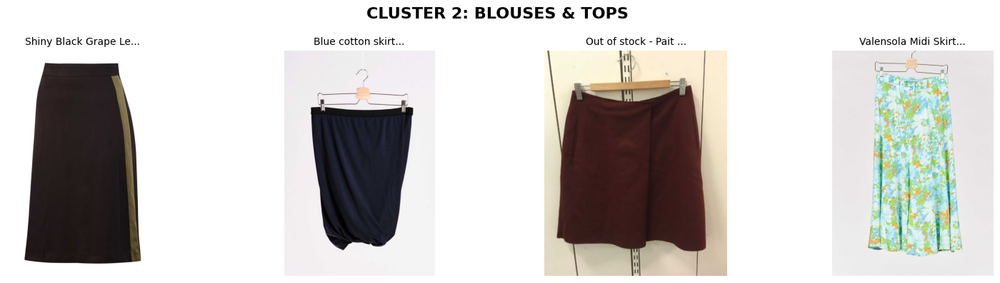

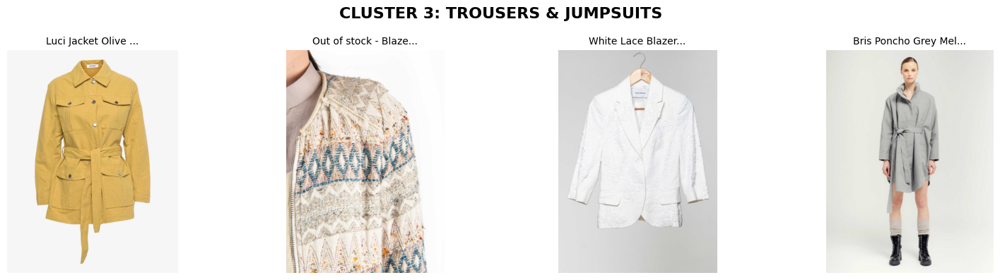

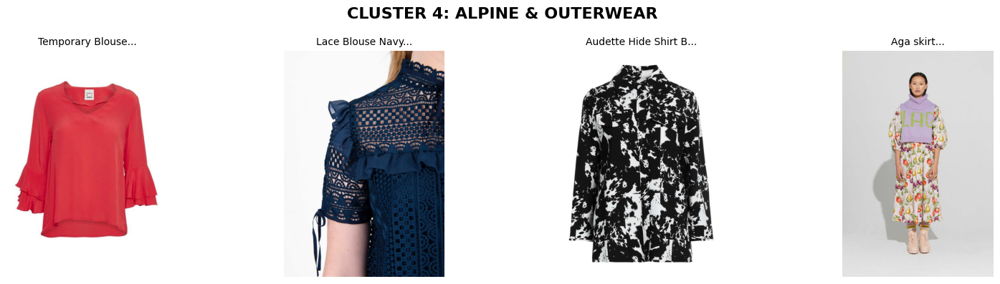

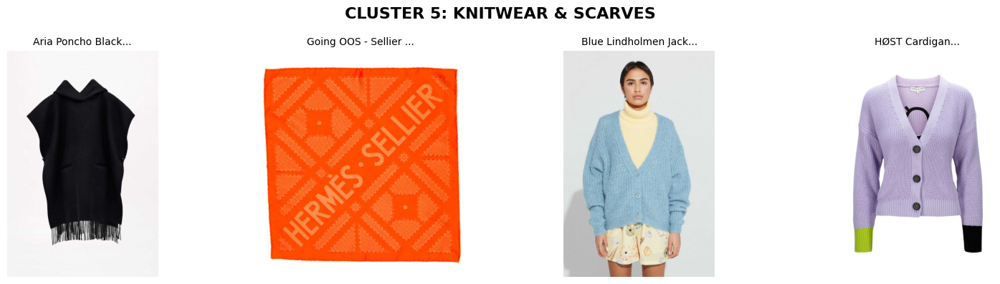

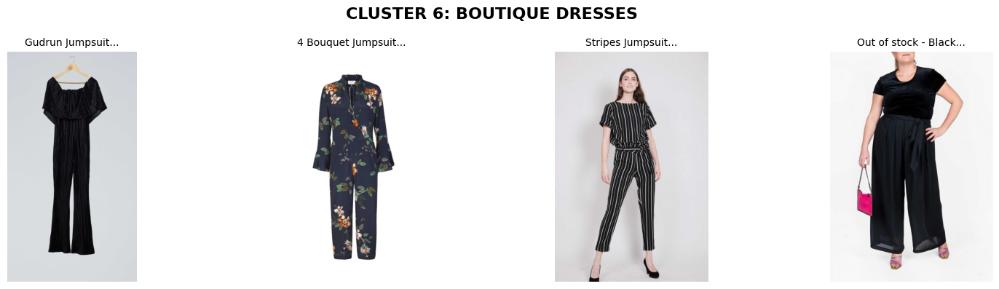

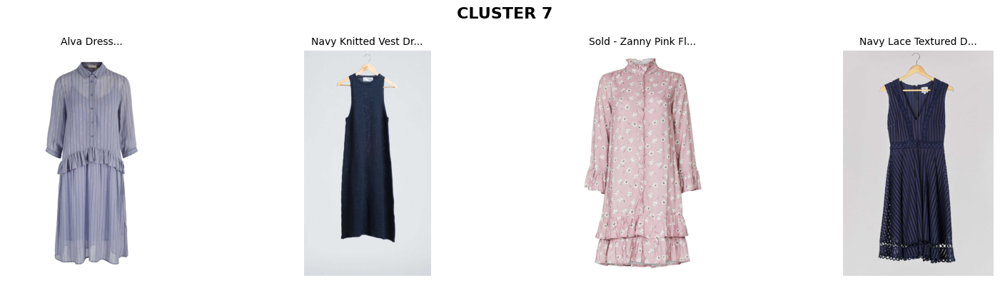

In [46]:
verify_cluster_labels(data_umap_hdbscan, DATA_IMAGES, cluster_names)